In [1]:
import sys
# sys.path.append('/home/cernypro/dev/source/ml4logs/src/bert')
sys.path.append('/home/cernypro/dev/source/ml4logs/src') # TODO: NEEDS REFACTOR, MANUALLY EDIT THE FILES IN ANOMALY DETECTION so instead of from datasets import ... it says from anomaly_detection.datasets import
sys.path.insert(1,'/home/cernypro/dev/source/ml4logs/src/anomaly_detection')  # TODO: needs to be done so the saved model can load, it's really bad

In [31]:
import torch
from pathlib import Path
import numpy as np
from tqdm import tqdm
import pandas as pd
import re
from typing import List, Tuple, Any, Dict
from collections import defaultdict
from lime.lime_text import LimeTextExplainer
import json
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import seaborn as sns
import tikzplotlib
sns.set()

In [3]:
from anomaly_detection.utils import load_pickle_file, classify
from anomaly_detection.datasets import CustomMinMaxScaler
from anomaly_detection.metrics import metrics_report

In [4]:
def load_hdfs1_log_file_grouped(log_path: Path) -> Dict:
    HDFS1_BLK_ID_PATTERN = re.compile(r'(blk_-?\d+)')
    blocks = defaultdict(list)
    with log_path.open(mode='r') as f:
        for line in f:
            block_id = HDFS1_BLK_ID_PATTERN.search(line).group()
            blocks[block_id].append(line.strip())
    return blocks


In [5]:
def sigmoid(x):
    return 1/(1+np.exp(-x))

def translated_sigmoid(center, zero_value_same_as_sig_val_for=-5):
    return lambda x: sigmoid( ((x-center)*(-zero_value_same_as_sig_val_for)) / center)

In [6]:
# SENTENCE_ENCODER_NAME = '1T_Eps_1_Combined_20210401_concat-to-max_epochs-3_seed-43_Seed-42_T-len_512_C-len_512_Tr-batch_32_Ev-b_64_O-dim_100'
SENTENCE_ENCODER_NAME = 'DistilbertMean_distilbert-base-cased_1T_Combined_20210401_smart-average_epochs-3_seed-43_Seed-42_T-len_512_C-len_512_Tr-batch_32_Ev-b_64_O-dim_100'

In [7]:
detector = torch.load(f'/home/cernypro/dev/source/ml4logs/models/anomaly_detection/AETCN_using_LogEncoder_from_{SENTENCE_ENCODER_NAME}/model.pt')

In [8]:
with open(f'/home/cernypro/dev/source/ml4logs/models/anomaly_detection/AETCN_using_LogEncoder_from_{SENTENCE_ENCODER_NAME}/run_info.json', mode='r') as f:
    threshold = json.load(f)['theta_val']

In [9]:
detector.window

45

In [10]:
X_train_raw = load_pickle_file(f'/home/cernypro/dev/source/ml4logs/data/interim/no_timestamps_train-data-HDFS1-cv1-1/labeled_embedding_from_LogEncoder_from_{SENTENCE_ENCODER_NAME}/X.pickle')
X_test_raw = load_pickle_file(f'/home/cernypro/dev/source/ml4logs/data/interim/no_timestamps_test-data-HDFS1/labeled_embedding_from_LogEncoder_from_{SENTENCE_ENCODER_NAME}/X.pickle')
y_test = np.load(f'/home/cernypro/dev/source/ml4logs/data/interim/no_timestamps_test-data-HDFS1/labeled_embedding_from_LogEncoder_from_{SENTENCE_ENCODER_NAME}/y.npy')

In [11]:
sc = CustomMinMaxScaler()
sc = sc.fit(X_train_raw)
X_test = sc.transform(X_test_raw)

In [12]:
idx = 6
metrics_report(y_test[:idx], classify(detector.predict(X_test[:idx]), threshold))

+----------------------------------+-----------+
| Metric                           | Score     |
+----------------------------------+-----------+
| Precision                        | 1.00000   |
+----------------------------------+-----------+
| Recall                           | 1.00000   |
+----------------------------------+-----------+
| F1 Score                         | 1.00000   |
+----------------------------------+-----------+
| Matthews Correlation Coefficient | 1.00000   |
+----------------------------------+-----------+


{'precision': 1.0, 'recall': 1.0, 'f1_score': 1.0, 'mcc_score': 1.0}

In [13]:
classify(detector.predict(X_test[:idx]), threshold)

array([0., 0., 0., 0., 0., 1.])

In [14]:
s = translated_sigmoid(threshold, 7)

In [15]:
s(detector.predict(X_test[:idx]))

array([0.88565975, 0.92500158, 0.89669632, 0.95743593, 0.92057851,
       0.37063995])

In [16]:
tst = np.empty((6,2))
tst[:,0] = s(detector.predict(X_test[:idx]))
tst[:,1] = 1 - tst[:, 0]
tst

array([[0.88565975, 0.11434025],
       [0.92500158, 0.07499842],
       [0.89669632, 0.10330368],
       [0.95743593, 0.04256407],
       [0.92057851, 0.07942149],
       [0.37063995, 0.62936005]])

In [17]:
a = np.empty((1,), dtype=object)
a[0] = X_test[0]
detector.predict(a)

array([0.00450761])

In [18]:
dataset = load_hdfs1_log_file_grouped(Path('/home/cernypro/dev/source/ml4logs/data/interim/HDFS1/no_timestamps_test-data-HDFS1.log'))
labels_df = pd.read_csv('/home/cernypro/dev/source/ml4logs/data/interim/HDFS1/test-labels-HDFS1.csv', converters={'Label': lambda x: x == 'Anomaly'})

In [19]:
def create_detector_input(mangled_lines, block_embeddings):
    """
    Block_embeddings is a matrix where each row is an embedding of a log line.
    Mangled lines expects a list of strings, where each string is formatted as described by create_encoded_line_from_block function
    Each string is split by the newline character, creating a list of strings which will be a logline prepended with it's index from the block. 
    Each log line will be parsed such that only the index is kept
    Now the mangled_lines which was List[str] is transformed into List[List[int]], e.g. a list of lists containing indices of used lines from the block.
    The indices are then used to create block embeddings using only the lines specified by the indices.
    So the result is a list of blocks embeddings, where all of them come from the block_embeddings but are possibly missing some rows compared to block_embeddings
    """
    detector_input = np.empty((len(mangled_lines),), dtype=object)
    for i, line in enumerate(mangled_lines):
#         print('a' + line)
        used_block_indices = [int(re.match(r'^\d+|', subline)[0]) for subline in line.split('\n') if subline]
        cur_block = np.empty((len(used_block_indices), block_embeddings.shape[1]))
        for real_idx, line_idx in enumerate(used_block_indices):
            cur_block[real_idx] = block_embeddings[line_idx]
        detector_input[i] = cur_block
    return detector_input

def predict_probas_detector(X, detector, threshold, block_embeddings, zero_value_same_as_sig_val_for=7):
    sigmoid_for_normal = translated_sigmoid(threshold, zero_value_same_as_sig_val_for)
    detector_input = create_detector_input(X, block_embeddings)
    reconstruction_errors = detector.predict(detector_input)
    probabilities = np.empty((len(X), 2))
    probabilities[:, 0] = sigmoid_for_normal(reconstruction_errors)
    probabilities[:, 1] = 1 - probabilities[:, 0]
    return probabilities

def create_encoded_line_from_block(block):
    """
    Given a list of strings, prepends each string with it's index in the list and the vertical separator | (pipe) symbol, 
    and then concatenates all the strings separated by newlines
    """
    return '\n'.join([f'{i}|{line}' for i, line in enumerate(block)])

def predict_proba_wrapper(detector, threshold, block_embeddings, zero_value_same_as_sig_val_for=7):
    def predict_proba_helper(X):
        return predict_probas_detector(X, detector, threshold, block_embeddings, zero_value_same_as_sig_val_for)
    return predict_proba_helper

In [20]:
b = create_detector_input(['\n'.join([f'{i}|{line}' for i, line in enumerate(dataset[labels_df['BlockId'][5]])]), '\n'.join([f'{i}|{line}' for i, line in enumerate(dataset[labels_df['BlockId'][6]])])], X_test[5])

In [21]:
idx = 5
X = [create_encoded_line_from_block(dataset[labels_df['BlockId'][idx]]), create_encoded_line_from_block(dataset[labels_df['BlockId'][idx+1]])]
predict_probas_detector(X, detector, threshold, X_test[idx])

array([[0.37064007, 0.62935993],
       [0.88433043, 0.11566957]])

In [22]:
dataset[labels_df['BlockId'][5]]

['INFO dfs.FSNamesystem: BLOCK* NameSystem.allocateBlock: /user/root/randtxt/_temporary/_task_200811092030_0003_m_000983_0/part-00983. blk_8367791625462110565',
 'INFO dfs.DataNode$DataXceiver: Receiving block blk_8367791625462110565 src: /10.251.195.33:57003 dest: /10.251.195.33:50010',
 'INFO dfs.DataNode$DataXceiver: Receiving block blk_8367791625462110565 src: /10.251.195.33:39521 dest: /10.251.195.33:50010',
 'INFO dfs.DataNode$DataXceiver: Receiving block blk_8367791625462110565 src: /10.251.203.166:32809 dest: /10.251.203.166:50010',
 'INFO dfs.FSNamesystem: BLOCK* NameSystem.addStoredBlock: blockMap updated: 10.251.203.166:50010 is added to blk_8367791625462110565 size 67108864',
 'INFO dfs.FSNamesystem: BLOCK* NameSystem.addStoredBlock: blockMap updated: 10.251.39.192:50010 is added to blk_8367791625462110565 size 67108864',
 'INFO dfs.DataNode$PacketResponder: PacketResponder 0 for block blk_8367791625462110565 terminating',
 'INFO dfs.DataNode$PacketResponder: Received block

In [23]:
class_names = ['Normal', 'Anomalous']
explainer = LimeTextExplainer(class_names=class_names, split_expression=u'\n')

In [24]:
labels_df[labels_df['Label']].head(n=10)

,BlockId,Label
5,blk_8367791625462110565,True
30,blk_-5219684520143343362,True
56,blk_-1867554151377778029,True
77,blk_4065231815205215963,True
101,blk_-3070602792522058638,True
137,blk_3477773006460763140,True
176,blk_6324269424054292578,True
182,blk_-3727478061303038137,True
218,blk_-2083830646535960419,True
279,blk_8584194374464968343,True


In [25]:
idx = 5
print(f"Truth: {'Anomalous' if labels_df['Label'][idx] else 'Normal'}")
text = create_encoded_line_from_block(dataset[labels_df['BlockId'][idx]])
exp = explainer.explain_instance(text, predict_proba_wrapper(detector, threshold, X_test[idx]), num_features=min(detector.window, X_test[idx].shape[0]))
exp.show_in_notebook(text=True)

Truth: Anomalous


In [26]:
def make_colormap(seq):
    """Return a LinearSegmentedColormap
    seq: a sequence of floats and RGB-tuples. The floats should be increasing
    and in the interval (0,1).
    """
    seq = [(None,) * 3, 0.0] + list(seq) + [1.0, (None,) * 3]
    cdict = {'red': [], 'green': [], 'blue': []}
    for i, item in enumerate(seq):
        if isinstance(item, float):
            r1, g1, b1 = seq[i - 1]
            r2, g2, b2 = seq[i + 1]
            cdict['red'].append([item, r1, r2])
            cdict['green'].append([item, g1, g2])
            cdict['blue'].append([item, b1, b2])
    return mcolors.LinearSegmentedColormap('CustomMap', cdict)

def diverge_map(low=(31/255, 119/255, 180/255), high=(1, 127/255, 14/255)):
    '''
    low and high are colors that will be used for the two
    ends of the spectrum. they can be either color strings
    or rgb color tuples
    '''
    c = mcolors.ColorConverter().to_rgb
    return make_colormap([low, c('white'), 0.5, c('white'), high])

In [27]:
lines, vals = map(list,zip(*sorted(exp.as_list(),key=lambda x: int(x[0].split('|')[0]))))
np_vals = np.array(vals)
# np_vals_0_1 = (np_vals - np_vals.min())/(np_vals.max() - np_vals.min())
np_vals_0_1 = (np_vals + np.abs(np_vals).max())/(np.abs(np_vals).max()*2)

# my_cmap = diverge_map(low=(0.0,1.0,0.0), high=(1.0,0.0,0.0))
my_cmap = diverge_map()

mapped_colors = [my_cmap(val)[:3] for val in np_vals_0_1]

def add_seq_split(text):
    return " ".join([f"\seqsplit{{{txt}}}" for txt in text.split(" ")])

latex = [f'\colorbox[rgb]{{{",".join(map(str, color))}}}{{\parbox{{\\textwidth}}{{{add_seq_split(text)}}}}}' for text, color in zip(lines, mapped_colors)]

In [28]:
print('\n'.join(latex).replace('$', '\$').replace('_', '\_'))

\colorbox[rgb]{0.26625144175317184,0.5545098039215687,0.754325259515571}{\parbox{\textwidth}{\seqsplit{0|INFO} \seqsplit{dfs.FSNamesystem:} \seqsplit{BLOCK*} \seqsplit{NameSystem.allocateBlock:} \seqsplit{/user/root/randtxt/\_temporary/\_task\_200811092030\_0003\_m\_000983\_0/part-00983.} \seqsplit{blk\_8367791625462110565}}}
\colorbox[rgb]{0.21113417916186084,0.5210457516339869,0.7358708189158016}{\parbox{\textwidth}{\seqsplit{1|INFO} \seqsplit{dfs.DataNode\$DataXceiver:} \seqsplit{Receiving} \seqsplit{block} \seqsplit{blk\_8367791625462110565} \seqsplit{src:} \seqsplit{/10.251.195.33:57003} \seqsplit{dest:} \seqsplit{/10.251.195.33:50010}}}
\colorbox[rgb]{0.20424452133794693,0.5168627450980392,0.7335640138408305}{\parbox{\textwidth}{\seqsplit{2|INFO} \seqsplit{dfs.DataNode\$DataXceiver:} \seqsplit{Receiving} \seqsplit{block} \seqsplit{blk\_8367791625462110565} \seqsplit{src:} \seqsplit{/10.251.195.33:39521} \seqsplit{dest:} \seqsplit{/10.251.195.33:50010}}}
\colorbox[rgb]{0.121568627

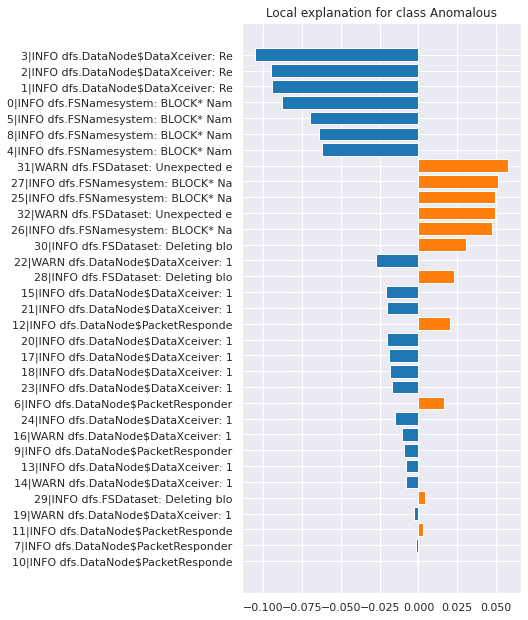

In [32]:
exp.as_pyplot_figure()
fig = plt.gcf()
fig.set_size_inches(5, 10.5)
ax = fig.get_axes()[0]
new_labels = [text.get_text()[:35] for text in ax.get_yticklabels()]
_ = ax.set_yticklabels(new_labels)
bars = [rect for rect in ax.get_children() if isinstance(rect, mpatches.Rectangle) and rect._facecolor[2] < 0.05]
my_blue = (0.12156862745098039, 0.4666666666666667, 0.7058823529411765, 1.0)
my_orange = (1.0, 0.4980392156862745, 0.054901960784313725, 1.0)
for bar in bars:
    bar.set_facecolor(my_blue if bar._facecolor[0] > 0.5 else my_orange)
    
tikzplotlib.save("LIMEAnomalyDetectionLineImportance.tikz")

In [30]:
exp.predict_proba

array([0.37063995, 0.62936005])

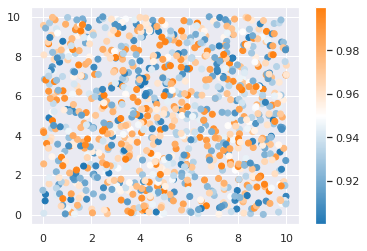

In [42]:
my_cmap = diverge_map()
my_cmap(1.0)[:3]
N = 1000
array_dg = np.random.uniform(0, 10, size=(N, 2))
colors = np.random.uniform(0.9, 1, size=(N,))
plt.scatter(array_dg[:, 0], array_dg[:, 1], c=colors, cmap=my_cmap)
plt.colorbar()
plt.show()

In [35]:
for idx, _ in labels_df[labels_df['Label']].head(n=10).iterrows():
    print(f"{idx} - Truth: {'Anomalous' if labels_df['Label'][idx] else 'Normal'}")
    text = create_encoded_line_from_block(dataset[labels_df['BlockId'][idx]])
    exp = explainer.explain_instance(text, predict_proba_wrapper(detector, threshold, X_test[idx]), num_features=min(detector.window, X_test[idx].shape[0]))
    exp.show_in_notebook(text=True)

5 - Truth: Anomalous


30 - Truth: Anomalous


56 - Truth: Anomalous


77 - Truth: Anomalous


101 - Truth: Anomalous


137 - Truth: Anomalous


176 - Truth: Anomalous


182 - Truth: Anomalous


218 - Truth: Anomalous


279 - Truth: Anomalous
